In [2]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse.linalg import svds

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [3]:
rating_data = pd.read_csv('user_review.csv')
perfume_data = pd.read_csv('ID_name.csv')

In [4]:
rating_data.head()

,userId,perfumeId,rating,title
0,0,145,5.0,lime basil & mandarin jomalone
1,0,248,4.0,warm cotton clean
2,0,152,4.0,blackberry & bay jomalone
3,0,34,5.0,gypsy water byredo
4,0,38,2.0,mojave ghost byredo


In [5]:
perfume_data.head()

,perfumeId,title
0,0,colonia acqua di parma
1,1,colonia futura acqua di parma
2,2,colonia pura acqua di parma
3,3,colonia intensa acqua di parma
4,4,colonia essenza acqua di parma


In [6]:
print(perfume_data.shape)
print(rating_data.shape)

(431, 2)
(429, 4)


In [7]:
rating_data.drop('title', axis=1, inplace =True)
rating_data.head()

,userId,perfumeId,rating
0,0,145,5.0
1,0,248,4.0
2,0,152,4.0
3,0,34,5.0
4,0,38,2.0


In [8]:
user_perfume_data = pd.merge(rating_data, perfume_data, on='perfumeId')
user_perfume_data.head()

,userId,perfumeId,rating,title
0,0,145,5.0,lime basil & mandarin jomalone
1,35,145,5.0,lime basil & mandarin jomalone
2,0,248,4.0,warm cotton clean
3,4,248,5.0,warm cotton clean
4,6,248,4.0,warm cotton clean


In [9]:
user_perfume_data.shape


(429, 4)

In [10]:
user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)


In [11]:
user_perfume_rating.shape

(36, 258)

In [12]:
user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [13]:
perfume_user_rating = user_perfume_rating.values.T
perfume_user_rating.shape

(258, 36)

In [14]:
type(perfume_user_rating)

numpy.ndarray

In [15]:
SVD = TruncatedSVD(n_components=12)
matrix = SVD.fit_transform(perfume_user_rating)
matrix.shape

(258, 12)

In [16]:
matrix[0]

array([ 0.22212158,  1.04103702,  0.69610893,  0.09644756,  0.92549229,
       -2.21168569,  0.97998944, -0.08862022, -0.51004135,  0.02952345,
       -0.27721193, -0.17603455])

In [17]:
corr = np.corrcoef(matrix)
corr.shape

(258, 258)

In [18]:
corr2 = corr[:200, :200]
corr2.shape

(200, 200)

<AxesSubplot:>

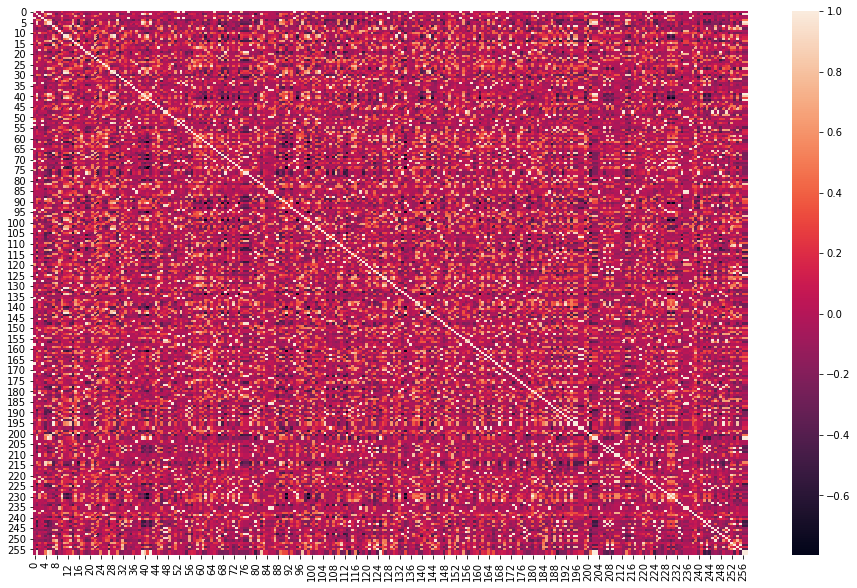

In [19]:
plt.figure(figsize=(16, 10))
sns.heatmap(corr)

In [20]:
perfume_title = user_perfume_rating.columns
perfume_title_list = list(perfume_title)
coffey_hands = perfume_title_list.index("eau triple lichen d'ecosse buly 1803")

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal',
 'tam dao eau de toilette diptyque']

In [21]:
corr_coffey_hands = corr[coffey_hands]
list(perfume_title[(corr_coffey_hands >= 0.9)])

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal',
 'tam dao eau de toilette diptyque']

In [22]:
df_user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='perfumeId').fillna(0)

In [23]:
df_user_perfume_rating.head()

perfumeId,34,36,37,38,41,50,51,57,62,65,...,421,422,423,424,425,426,427,428,429,430
userId,,,,,,,,,,,,,,,,,,,,,
0,5.0,0.0,0.0,2.0,0.0,0.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
matrix = df_user_perfume_rating.values

user_ratings_mean = np.mean(matrix, axis =1)

matrix_user_mean =matrix-user_ratings_mean.reshape(-1,1)

In [25]:
matrix

array([[5., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 4., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 5., 4., ..., 0., 0., 3.]])

In [26]:
matrix.shape

(36, 258)

In [27]:
user_ratings_mean.shape

(36,)

In [28]:
pd.DataFrame(matrix_user_mean, columns=df_user_perfume_rating.columns).head()

perfumeId,34,36,37,38,41,50,51,57,62,65,...,421,422,423,424,425,426,427,428,429,430
0,4.891473,-0.108527,-0.108527,1.891473,-0.108527,-0.108527,2.891473,-0.108527,-0.108527,-0.108527,...,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527,-0.108527
1,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,...,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039,-0.155039
2,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,...,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775,-0.100775
3,-0.174419,-0.174419,4.825581,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,...,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419,-0.174419
4,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,...,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302,-0.209302


In [29]:
U, sigma, Vt = svds(matrix_user_mean, k=12)

In [30]:
print(U.shape)
print(sigma.shape)
print(Vt.shape)

(36, 12)
(12,)
(12, 258)


In [31]:
sigma = np.diag(sigma)

In [32]:
sigma.shape

(12, 12)

In [33]:
svd_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + user_ratings_mean.reshape(-1, 1)

In [34]:
df_svd_preds = pd.DataFrame(svd_user_predicted_ratings, columns = df_user_perfume_rating.columns)
df_svd_preds.head()

perfumeId,34,36,37,38,41,50,51,57,62,65,...,421,422,423,424,425,426,427,428,429,430
0,1.632142,0.363295,0.362696,0.324880,-0.279388,0.683827,0.380765,-0.099217,0.149331,0.211841,...,-0.053371,0.864334,-0.057164,0.066634,0.451760,-0.039848,-0.053371,0.451760,-0.039518,0.202697
1,0.472647,0.603035,-0.118143,-0.570805,-0.086779,0.287697,0.147711,0.059649,0.050647,0.053222,...,0.403326,0.348891,0.493428,0.149291,0.238748,-0.112247,0.403326,0.238748,-0.081213,0.378989
2,-0.078815,-0.105146,0.876862,-0.148192,0.271967,0.070886,-0.020276,0.034132,0.002480,-0.009940,...,-0.061860,0.078673,-0.087259,0.048975,0.509795,-0.059593,-0.061860,0.509795,-0.039726,-0.047192
3,0.522997,0.402784,3.825874,-0.320922,-0.018079,0.282548,-0.067213,-0.175994,0.216451,0.295697,...,-0.192093,0.358508,-0.234794,-0.132670,-0.228249,0.296438,-0.192093,-0.228249,0.232893,0.233154
4,1.093956,-0.069785,1.238469,0.557171,0.282252,0.079754,0.472600,0.030953,0.362601,0.454920,...,0.144204,0.078282,0.158844,0.172239,0.132158,0.272690,0.144204,0.132158,0.235281,-0.007613


In [35]:
def recommend_perfumes(df_svd_preds, user_id, ori_movies_df, ori_ratings_df, num_recommendations=5):
    user_row_number = user_id
    sorted_user_predictions = df_svd_preds.iloc[user_row_number].sort_values(ascending=False)
    user_data = ori_ratings_df[ori_ratings_df.userId == user_id]
    user_history = user_data.merge(ori_movies_df, on = 'perfumeId').sort_values(['rating'], ascending=False)
    recommendations = ori_movies_df[~ori_movies_df['perfumeId'].isin(user_history['perfumeId'])]
    recommendations = recommendations.merge( pd.DataFrame(sorted_user_predictions).reset_index(), on = 'perfumeId')
    recommendations = recommendations.rename(columns = {user_row_number: 'Predictions'}).sort_values('Predictions', ascending = False).iloc[:num_recommendations, :]

    return user_history, recommendations

In [36]:
already_rated, predictions = recommend_perfumes(df_svd_preds, 1, perfume_data, user_perfume_data, 10)

In [37]:
already_rated.head(10)

,userId,perfumeId,rating,title_x,title_y
5,1,253,5.0,eclat d'arpege pour homme lanvin,eclat d'arpege pour homme lanvin
6,1,337,5.0,modern princess lanvin,modern princess lanvin
0,1,152,4.0,blackberry & bay jomalone,blackberry & bay jomalone
2,1,167,4.0,peony & blushsuede jomalone,peony & blushsuede jomalone
4,1,126,4.0,l'ombre dans l'eau eau de toilette diptyque,l'ombre dans l'eau eau de toilette diptyque
8,1,275,4.0,secret wish anna sui,secret wish anna sui
1,1,221,3.0,eau triple lichen d'ecosse buly 1803,eau triple lichen d'ecosse buly 1803
3,1,287,3.0,alizarin penhaligon's,alizarin penhaligon's
9,1,375,3.0,fantasia anna sui,fantasia anna sui
10,1,388,3.0,chance eau tendre chanel,chance eau tendre chanel


In [38]:
predictions

,perfumeId,title,Predictions
131,311,flower by kenzo kenzo,1.319439
36,160,wood sage & sea salt jomalone,1.168274
84,262,amazing grace ballet rose philosophy,1.149165
51,228,ck be calvin klein,1.016728
62,239,amazing grace philosophy,0.977774
90,268,pansy lush,0.827959
129,309,ck one shock for her calvin klein,0.821967
235,419,jeanne lanvin,0.821967
228,412,코튼키스 포맨트,0.821967
32,145,lime basil & mandarin jomalone,0.777684


In [39]:
already_rated, predictions = recommend_perfumes(df_svd_preds, 2, perfume_data, user_perfume_data, 10)

In [41]:
already_rated.head(10)

,userId,perfumeId,rating,title_x,title_y
0,2,222,5.0,eclat d'arpege lanvin,eclat d'arpege lanvin
1,2,249,5.0,jeanne lanvin lanvin,jeanne lanvin lanvin
2,2,162,5.0,english pear & fressia jomalone,english pear & fressia jomalone
3,2,288,5.0,illicit flower jimmy choo,illicit flower jimmy choo
4,2,269,3.0,jimmy choo jimmy choo,jimmy choo jimmy choo
5,2,323,3.0,flight of fancy anna sui,flight of fancy anna sui


In [42]:
predictions


,perfumeId,title,Predictions
51,226,incanto charms salvatore ferragamo,1.129298
118,296,miss dior blooming bouquet christian dior,0.942320
2,37,blanche byredo,0.876862
21,122,eau rose eau de toilette diptyque,0.832274
35,152,blackberry & bay jomalone,0.692460
235,414,dalilight salvador dali,0.658457
186,365,nectarine blossom & honey,0.647032
71,246,eclat d’arpège lanvin,0.630185
81,257,marry me lanvin,0.586776
72,247,le jardin de monsieur li hermès,0.585861
